In [15]:
import requests 

In [16]:
url= 'https://api.nal.usda.gov/fdc/v1/foods/list?api_key=HZcnyzatz8YL4TCnjVtjlBEMsVhB5sGn5AjI1U7l'

In [17]:
response = requests.get(url)

In [18]:
print(response)
json = response.json()

<Response [200]>


In [19]:
json[0]

{'fdcId': 2353623,
 'description': 'A Low-Starch and High-Fiber Diet Intervention Impacts the Microbial Community of Raw Bovine Milk',
 'dataType': 'Experimental',
 'publicationDate': '2022-10-28',
 'foodNutrients': []}

In [20]:
def requestAllFood():
    pageNum = 1
    foods = []
    while True:
        url = 'https://api.nal.usda.gov/fdc/v1/foods/list?api_key=HZcnyzatz8YL4TCnjVtjlBEMsVhB5sGn5AjI1U7l&pageSize=200&pageNumber='+str(pageNum)
        req = requests.get(url)
        if not req.ok:
            break
        foods = foods + req.json()
        pageNum = pageNum + 1
    print(pageNum)
    return foods

In [12]:
listOfFoods = requestAllFood()

51


In [75]:
listOfFoods

[{'fdcId': 2353623,
  'description': 'A Low-Starch and High-Fiber Diet Intervention Impacts the Microbial Community of Raw Bovine Milk',
  'dataType': 'Experimental',
  'publicationDate': '2022-10-28',
  'foodNutrients': []},
 {'fdcId': 2341752,
  'description': 'Abalone',
  'dataType': 'Survey (FNDDS)',
  'publicationDate': '2022-10-28',
  'foodCode': '26301110',
  'foodNutrients': [{'number': '203',
    'name': 'Protein',
    'amount': 21.2,
    'unitName': 'G'},
   {'number': '204',
    'name': 'Total lipid (fat)',
    'amount': 6.12,
    'unitName': 'G'},
   {'number': '205',
    'name': 'Carbohydrate, by difference',
    'amount': 7.46,
    'unitName': 'G'},
   {'number': '208', 'name': 'Energy', 'amount': 177, 'unitName': 'KCAL'},
   {'number': '221', 'name': 'Alcohol, ethyl', 'amount': 0.0, 'unitName': 'G'},
   {'number': '255', 'name': 'Water', 'amount': 62.7, 'unitName': 'G'},
   {'number': '262', 'name': 'Caffeine', 'amount': 0.0, 'unitName': 'MG'},
   {'number': '263', 'name

In [96]:
def getIron():
    iron = []
    for food in listOfFoods:
        name = food['description']
        for nutrient in food['foodNutrients']:
            if nutrient['name'] == 'Iron, Fe':
                amount = nutrient['amount']
                temp = {'Name': name, 'Iron': amount}
                iron.append(temp)
    return iron

In [97]:
import pandas as pd
data = getIron()

In [98]:
df = pd.DataFrame(data)

In [100]:
df.head()

,Name,Iron
0,Abalone,3.97
1,"Abiyuch, raw",1.61
2,"Acerola juice, raw",0.50
3,"Acerola, (west indian cherry), raw",0.20
4,Acorn stew (Apache),1.00


In [141]:
top = df.sort_values(by='Iron', ascending=False)

<AxesSubplot:xlabel='Iron', ylabel='Name'>

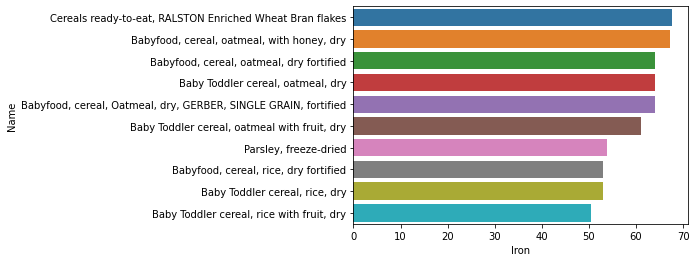

In [146]:
top10 = top[:10]
sns.barplot(data = top10, y = 'Name', x = 'Iron')

In [158]:
for i in df:
    if i['Name'].contain('Babyfood'):
        ['Name'].drop()

TypeError: 'NoneType' object is not iterable